In [2]:
#!pip install category_encoders

In [245]:
import pandas as pd
import numpy as np
import category_encoders as ce
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from scipy import interp
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
from sklearn import neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
import seaborn as sns
import warnings
import json
warnings.filterwarnings('ignore')

In [246]:
#wyre_raw = pd.read_csv("Chargebacks.csv")
#wyre_raw.head()
#wyre_json = json.loads('Chargebacks_wyre_may.json')
f=open('Chargebacks_wyre_may.json', encoding="utf8")
wyre_json = json.load(f)
wyre_json[0]
#We will train the model on a data that we have the case results on already. New data will be loaded too in order to make prediction on that.
#no_res = open('Chargebacks_wyre_may.json', encoding="utf8") #אנחנו צריכים לשנות את הקובץ שאנחנו פותחים פה, בגלל שאין לי את זה אנחנו נשאיר את זה ככה בינתיים
#test_json = json.load(no_res)
#test_json[0]

{'_id': {'$oid': '61254ae49782f20007d416e8'},
 'chargeback_id': '2020339012482',
 '__v': 2,
 'ac_metadata': {'dataSources': ['identity-providers', 'reason-group'],
  'wasPspDecisionResultNotified': False,
  'migrationObjects': ['b2b',
   'billing',
   'appeal',
   'proof',
   'return',
   'customer',
   'order',
   'communication',
   'shipping',
   'subscription',
   'fee',
   'risk',
   'refund',
   'usage',
   'industry',
   'verification',
   'cancellation',
   'card',
   'transaction',
   'internal'],
  'missingDataSources': [],
  '_id': {'$oid': '6214e6ff09c0481a0410f6cb'},
  'handlingChargebacksType': 'internal',
  'createdAt': {'$date': {'$numberLong': '1662545524620'}},
  'updatedAt': {'$date': {'$numberLong': '1662545524620'}},
  'systemNotes': [],
  'internalReasonGroup': {'$oid': '61c49e6280c2812d68bf1d53'},
  'dataEnhancements': {'provided': ['verifications']}},
 'amount': 304.78,
 'analyst_data': {'labels': [],
  'status': 9,
  'status_last_update': {'$date': {'$numberLon

In [278]:
wyre_raw = pd.json_normalize(wyre_json)
#no_res = pd.json_normalize(test_json)
wyre_raw

,chargeback_id,__v,amount,arn,billing_address_line_1,card_bin,card_last_four_digits,card_scheme,cryptoDestination,cryptoRate,cryptoSiteName,cryptoTransactionAmountWithNoFees,cryptoUsdFees,crypto_purchased_amount,crypto_purchased_currency,currency,email,evidence_list,first_name,ip_address,last_name,lifecycleStage,merchantUuid,merchant_id,merchant_reference_id,numberOfDaysBetweenPosingCbkAndTransaction,paymentMethod,phone,psp,psp_status,reason_code,reason_group,refunded,related_refunds,transaction_amount,merchantName,usages,shouldFight,_id.$oid,ac_metadata.dataSources,ac_metadata.wasPspDecisionResultNotified,ac_metadata.migrationObjects,ac_metadata.missingDataSources,ac_metadata._id.$oid,ac_metadata.handlingChargebacksType,ac_metadata.createdAt.$date.$numberLong,ac_metadata.updatedAt.$date.$numberLong,ac_metadata.systemNotes,ac_metadata.internalReasonGroup.$oid,ac_metadata.dataEnhancements.provided,analyst_data.labels,analyst_data.status,analyst_data.status_last_update.$date.$numberLong,analyst_data.analysis._id.$oid,analyst_data.evidenceGenerationLevel,analyst_data._id.$oid,analyst_data.notes,analyst_data.sent_to_psp_on.$date.$numberLong,analyst_data.updatedAt.$date.$numberLong,analyst_data.createdAt.$date.$numberLong,analyst_data.statusHistory,createdAt.$date.$numberLong,due_date.$date.$numberLong,final_decision_date.$date.$numberLong,psp_created_date.$date.$numberLong,transaction_created_date.$date.$numberLong,updatedAt.$date.$numberLong,amountConverted.USD,amountConverted.EUR,amountConverted.GBP,amountConverted.JPY,amountConverted.AUD,amountConverted.CAD,amountConverted.source,amountConverted.date.$date.$numberLong,authorization._id.$oid,authorization.createdAt.$date.$numberLong,authorization.updatedAt.$date.$numberLong,discount._id.$oid,discount.createdAt.$date.$numberLong,discount.updatedAt.$date.$numberLong,early_fraud_warning._id.$oid,early_fraud_warning.createdAt.$date.$numberLong,early_fraud_warning.updatedAt.$date.$numberLong,transaction.refund._id.$oid,transaction.refund.items,transaction._id.$oid,transaction.billing._id.$oid,transaction.billing.address._id.$oid,transaction.billing.address.addressLine1,transaction.createdAt.$date.$numberLong,transaction.updatedAt.$date.$numberLong,transaction.order.associatedTransactionIds,transaction.order._id.$oid,transaction.order.phone,transaction.order.email,transaction.order.firstName,transaction.order.lastName,transaction.order.ipAddress,transaction.order.items,transaction.notification._id.$oid,transaction.metadata._id.$oid,transaction.explanation._id.$oid,transaction.industry._id.$oid,transaction.industry.crypto._id.$oid,transaction.industry.crypto.cryptoPurchasedCurrency,transaction.industry.crypto.cryptoPurchasedAmount,transaction.industry.crypto.cryptoRate,transaction.industry.crypto.cryptoAddress,transaction.card._id.$oid,transaction.card.scheme,transaction.card.bin,transaction.card.lastFourDigits,transaction.psp,transaction.paymentMethod,transaction.arn,transaction.merchantReferenceId,transaction.amount,transaction.createdDate.$date.$numberLong,vendorDetails._id.$oid,vendorDetails.createdAt.$date.$numberLong,vendorDetails.updatedAt.$date.$numberLong,state._id.$oid,state.lifecycleStage,state.reasonCode,state.reasonGroup,state.postingDate.$date.$numberLong,state.finalDecisionDate.$date.$numberLong,state.dueDate.$date.$numberLong,state.pspStatus,state.updatedAt.$date.$numberLong,state.createdAt.$date.$numberLong,internal.labels,internal.evidenceGenerationLevel,internal.fraudChecks._id.$oid,internal.internalVerification._id.$oid,internal.internalVerification.avsMatchResult,internal.internalVerification.cvvMatchResult,internal.internalVerification.threeDSMatchResult,internal._id.$oid,internal.merchantName,internal.status,internal.statusHistory,internal.statusLastUpdate.$date.$numberLong,internal.notes,internal.sentToPspOn.$date.$numberLong,internal.analysis._id.$oid,internal.enhancements._id.$oid,internal.identityCheck.identityVerificationsNames,internal.identityCheck._id.$oi

In [248]:
#Here we counted some things in order to see how rare things are 
#print(wyre_raw["amountConverted.USD"].value_counts())
#print(wyre_raw["cryptoSiteName"].value_counts())
#print(wyre_raw["network_id"].value_counts())
#print(wyre_raw["billing_state"].value_counts())
#print(wyre_raw["refundStatusCode"].value_counts())
#print(wyre_raw["reason_code"].value_counts())

In [249]:
#פה צריך לטעון את הקובץ עם הצ'ארג'בקים הלא פתורים
f2=open('Chargebacks_wyre_may.json', encoding="utf8") 
wyre_json_copy = json.load(f2)
wyre_json_copy

[{'_id': {'$oid': '61254ae49782f20007d416e8'},
  'chargeback_id': '2020339012482',
  '__v': 2,
  'ac_metadata': {'dataSources': ['identity-providers', 'reason-group'],
   'wasPspDecisionResultNotified': False,
   'migrationObjects': ['b2b',
    'billing',
    'appeal',
    'proof',
    'return',
    'customer',
    'order',
    'communication',
    'shipping',
    'subscription',
    'fee',
    'risk',
    'refund',
    'usage',
    'industry',
    'verification',
    'cancellation',
    'card',
    'transaction',
    'internal'],
   'missingDataSources': [],
   '_id': {'$oid': '6214e6ff09c0481a0410f6cb'},
   'handlingChargebacksType': 'internal',
   'createdAt': {'$date': {'$numberLong': '1662545524620'}},
   'updatedAt': {'$date': {'$numberLong': '1662545524620'}},
   'systemNotes': [],
   'internalReasonGroup': {'$oid': '61c49e6280c2812d68bf1d53'},
   'dataEnhancements': {'provided': ['verifications']}},
  'amount': 304.78,
  'analyst_data': {'labels': [],
   'status': 9,
   'status

In [250]:
pd.set_option('display.max_columns', None)
wyre_raw.isna().sum()
wyre_raw.head()

,chargeback_id,__v,amount,arn,billing_address_line_1,card_bin,card_last_four_digits,card_scheme,cryptoDestination,cryptoRate,cryptoSiteName,cryptoTransactionAmountWithNoFees,cryptoUsdFees,crypto_purchased_amount,crypto_purchased_currency,currency,email,evidence_list,first_name,ip_address,last_name,lifecycleStage,merchantUuid,merchant_id,merchant_reference_id,numberOfDaysBetweenPosingCbkAndTransaction,paymentMethod,phone,psp,psp_status,reason_code,reason_group,refunded,related_refunds,transaction_amount,merchantName,usages,shouldFight,_id.$oid,ac_metadata.dataSources,ac_metadata.wasPspDecisionResultNotified,ac_metadata.migrationObjects,ac_metadata.missingDataSources,ac_metadata._id.$oid,ac_metadata.handlingChargebacksType,ac_metadata.createdAt.$date.$numberLong,ac_metadata.updatedAt.$date.$numberLong,ac_metadata.systemNotes,ac_metadata.internalReasonGroup.$oid,ac_metadata.dataEnhancements.provided,analyst_data.labels,analyst_data.status,analyst_data.status_last_update.$date.$numberLong,analyst_data.analysis._id.$oid,analyst_data.evidenceGenerationLevel,analyst_data._id.$oid,analyst_data.notes,analyst_data.sent_to_psp_on.$date.$numberLong,analyst_data.updatedAt.$date.$numberLong,analyst_data.createdAt.$date.$numberLong,analyst_data.statusHistory,createdAt.$date.$numberLong,due_date.$date.$numberLong,final_decision_date.$date.$numberLong,psp_created_date.$date.$numberLong,transaction_created_date.$date.$numberLong,updatedAt.$date.$numberLong,amountConverted.USD,amountConverted.EUR,amountConverted.GBP,amountConverted.JPY,amountConverted.AUD,amountConverted.CAD,amountConverted.source,amountConverted.date.$date.$numberLong,authorization._id.$oid,authorization.createdAt.$date.$numberLong,authorization.updatedAt.$date.$numberLong,discount._id.$oid,discount.createdAt.$date.$numberLong,discount.updatedAt.$date.$numberLong,early_fraud_warning._id.$oid,early_fraud_warning.createdAt.$date.$numberLong,early_fraud_warning.updatedAt.$date.$numberLong,transaction.refund._id.$oid,transaction.refund.items,transaction._id.$oid,transaction.billing._id.$oid,transaction.billing.address._id.$oid,transaction.billing.address.addressLine1,transaction.createdAt.$date.$numberLong,transaction.updatedAt.$date.$numberLong,transaction.order.associatedTransactionIds,transaction.order._id.$oid,transaction.order.phone,transaction.order.email,transaction.order.firstName,transaction.order.lastName,transaction.order.ipAddress,transaction.order.items,transaction.notification._id.$oid,transaction.metadata._id.$oid,transaction.explanation._id.$oid,transaction.industry._id.$oid,transaction.industry.crypto._id.$oid,transaction.industry.crypto.cryptoPurchasedCurrency,transaction.industry.crypto.cryptoPurchasedAmount,transaction.industry.crypto.cryptoRate,transaction.industry.crypto.cryptoAddress,transaction.card._id.$oid,transaction.card.scheme,transaction.card.bin,transaction.card.lastFourDigits,transaction.psp,transaction.paymentMethod,transaction.arn,transaction.merchantReferenceId,transaction.amount,transaction.createdDate.$date.$numberLong,vendorDetails._id.$oid,vendorDetails.createdAt.$date.$numberLong,vendorDetails.updatedAt.$date.$numberLong,state._id.$oid,state.lifecycleStage,state.reasonCode,state.reasonGroup,state.postingDate.$date.$numberLong,state.finalDecisionDate.$date.$numberLong,state.dueDate.$date.$numberLong,state.pspStatus,state.updatedAt.$date.$numberLong,state.createdAt.$date.$numberLong,internal.labels,internal.evidenceGenerationLevel,internal.fraudChecks._id.$oid,internal.internalVerification._id.$oid,internal.internalVerification.avsMatchResult,internal.internalVerification.cvvMatchResult,internal.internalVerification.threeDSMatchResult,internal._id.$oid,internal.merchantName,internal.status,internal.statusHistory,internal.statusLastUpdate.$date.$numberLong,internal.notes,internal.sentToPspOn.$date.$numberLong,internal.analysis._id.$oid,internal.enhancements._id.$oid,internal.identityCheck.identityVerificationsNames,internal.identityCheck._id.$oi

In [251]:
wyre_raw['index'] = range(0, len(wyre_raw))
#Most columns are irrelevant, so we will work only on these columns.
wyre = wyre_raw[['index','amountConverted.USD','internal.enhancements.ekata.address',
               'internal.enhancements.ekata.phone','internal.enhancements.ekata.emailUsername',
                'internal.enhancements.ekata.ipAddress','analyst_data.status',
                'internal.enhancements.trueCaller.approved','transaction.card.appleLast4Digits',
                'internal.internalVerification.avsMatchResult','transaction.billing.address.state',
                'transaction.billing.address.zipCode','card_last_four_digits','card_scheme',
                'cryptoDestination','cryptoSiteName','cryptoUsdFees','crypto_purchased_currency',
                'email','ip_address','numberOfDaysBetweenPosingCbkAndTransaction',
                'paymentMethod','psp','psp_status','reason_group',
                'refunded']] 
# test = no_res[['index','amountConverted.USD','internal.enhancements.ekata.address',
#                'internal.enhancements.ekata.phone','internal.enhancements.ekata.emailUsername',
#                 'internal.enhancements.ekata.ipAddress','analyst_data.status',
#                 'internal.enhancements.trueCaller.approved','transaction.card.appleLast4Digits',
#                 'internal.internalVerification.avsMatchResult','transaction.billing.address.state',
#                 'transaction.billing.address.zipCode','card_last_four_digits','card_scheme',
#                 'cryptoDestination','cryptoSiteName','cryptoUsdFees','crypto_purchased_currency',
#                 'email','ip_address','numberOfDaysBetweenPosingCbkAndTransaction',
#                 'paymentMethod','psp','reason_group',
#                 'refunded']] 
wyre.isna().sum()

index                                              0
amountConverted.USD                                1
internal.enhancements.ekata.address             1402
internal.enhancements.ekata.phone               1420
internal.enhancements.ekata.emailUsername       1404
internal.enhancements.ekata.ipAddress           1404
analyst_data.status                                0
internal.enhancements.trueCaller.approved       1399
transaction.card.appleLast4Digits               1054
internal.internalVerification.avsMatchResult       0
transaction.billing.address.state                391
transaction.billing.address.zipCode              391
card_last_four_digits                              0
card_scheme                                        0
cryptoDestination                                  1
cryptoSiteName                                     1
cryptoUsdFees                                     27
crypto_purchased_currency                          1
email                                         

# Clean the data

In [252]:
#Due to changes in the data while working, we had to adjust some of the column names.
wyre.rename(columns = {'internal.enhancements.ekata.address':'analyst_data.ekataAdress',
                     'internal.enhancements.ekata.phone':'analyst_data.ekataPhone', 
                     'internal.enhancements.ekata.emailUsername':'analyst_data.ekata_email_username', 
                     'internal.enhancements.ekata.ipAddress':'analyst_data.ekata_ip_address', 
                     'internal.enhancements.trueCaller.approved':'analyst_data.truecaller', 
                     'transaction.card.appleLast4Digits':'appleLast4Digits', 
                     'internal.internalVerification.avsMatchResult':'avs', 
                     'transaction.billing.address.state':'billing_state' , 
                     'transaction.billing.address.zipCode':'billing_zip_code', 
                     'reason_group': 'reason', 'refunded':'refundStatusCode'}, inplace = True)

# test.rename(columns = {'internal.enhancements.ekata.address':'analyst_data.ekataAdress',
#                      'internal.enhancements.ekata.phone':'analyst_data.ekataPhone', 
#                      'internal.enhancements.ekata.emailUsername':'analyst_data.ekata_email_username', 
#                      'internal.enhancements.ekata.ipAddress':'analyst_data.ekata_ip_address', 
#                      'internal.enhancements.trueCaller.approved':'analyst_data.truecaller', 
#                      'transaction.card.appleLast4Digits':'appleLast4Digits', 
#                      'internal.internalVerification.avsMatchResult':'avs', 
#                      'transaction.billing.address.state':'billing_state' , 
#                      'transaction.billing.address.zipCode':'billing_zip_code', 
#                      'reason_group': 'reason', 'refunded':'refundStatusCode'}, inplace = True)

<AxesSubplot:>

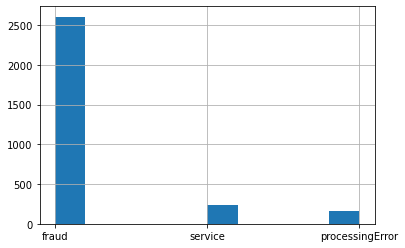

In [253]:
wyre['reason'].hist()

<AxesSubplot:title={'center':'Most Purchased Coins'}>

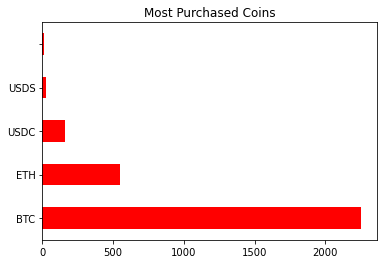

In [254]:
wyre.crypto_purchased_currency.value_counts(ascending=False).head().plot.barh(color="red", title="Most Purchased Coins")

In [255]:
wyre = wyre.replace(np.nan, 0) #If there is a "NaN" in the columns of the matches, it usually means that the analyst was lazy to fill the box in the "analyst tool" when there isn't a match. So if the analyst didn't fill anything, it usually means that there is a false match (no match). 
wyre = wyre.replace("FALSE", 0)
wyre = wyre.replace("false",0)
wyre = wyre.replace("true",1)
wyre = wyre.replace("TRUE", 1)
wyre = wyre.replace("notApplicable",0)

# test = test.replace(np.nan, 0) 
# test = test.replace("FALSE", 0)
# test = test.replace("false",0)
# test = test.replace("true",1)
# test = test.replace("TRUE", 1)
# test = test.replace("notApplicable",0)

#These are the labels we did one hot encoding on. In the project we did many trial and error with the encoding methods and feature selection.
hottest = ['analyst_data.status','avs','reason','psp','card_scheme','crypto_purchased_currency','paymentMethod']

#In the chargebacks, the analysts check for match between the cardholder and the details (email, ip, phone number and address). 
#We assume that in a big enough sample, the more matches we have the higher probability we will win the case.
matches = wyre[['analyst_data.ekataAdress',
               'analyst_data.ekataPhone','analyst_data.ekata_email_username',
                'analyst_data.ekata_ip_address','analyst_data.truecaller']]
# matches_2 = test[['analyst_data.ekataAdress',
#                'analyst_data.ekataPhone','analyst_data.ekata_email_username',
#                 'analyst_data.ekata_ip_address','analyst_data.truecaller']]
wyre["match_count"] = matches.sum(axis = 1)
# test["match_count"] = matches_2.sum(axis = 1)
for i in hottest:  
    hot = pd.get_dummies(wyre[i],prefix=i)
    wyre = wyre.join(hot)
    wyre = wyre.drop([i],axis=1)
    #hot2 = pd.get_dummies(test[i],prefix=i)
    #test = test.join(hot)
    #test = test.drop([i],axis=1)

wyre["psp_status"] = wyre["psp_status"].replace("lost",0)
wyre["psp_status"] = wyre["psp_status"].replace("won",1)
#wyre["psp_status"] = wyre["psp_status"].replace("needs_response",null)
#wyre["psp_status"] = wyre["psp_status"].replace("evidence_not_submitted_by_psp",null)
#wyre["psp_status"] = wyre["psp_status"].replace("unknown",null)
#wyre["psp_status"] = wyre["psp_status"].replace("under_review",null)


#Here we tried to ignore billing states or crypto wallets without enough data on. We saw that this doesn't really improve our model so we left this as a comment.
# wyre.loc[wyre.groupby('cryptoSiteName')['index']
#          .transform('size')
#          .div(len(wyre))
#          .lt(0.01), 
#        'cryptoSiteName'] = 'Other'

# wyre.loc[wyre.groupby('billing_state')['index']
#          .transform('size')
#          .div(len(wyre))
#          .lt(0.03), 
#        'billing_state'] = 'Other'

#binary encoding on the crypto sitename and the billing states
ce_be = ce.BinaryEncoder(cols=['cryptoSiteName'])
wyre_binary = ce_be.fit_transform(wyre["cryptoSiteName"])

ce_be = ce.BinaryEncoder(cols=['billing_state'])
billing = ce_be.fit_transform(wyre["billing_state"])

# test_binary = ce_be.fit_transform(test["cryptoSiteName"])
# test_binary = ce_be.fit_transform(test["billing_state"])


#In the analyst tool, when there is no ip address available it says "ull"
#ip address:
#wyre["ip_address"] = wyre["ip_address"].replace("ull,", 0)
#maybe
#We want to know how many transactions were made by the same cardholder, so we created some columns with these details.
wyre["crypto_address_count"] = wyre.cryptoDestination.map(wyre.cryptoDestination.value_counts())
wyre["four_dig_count"] = wyre.card_last_four_digits.map(wyre.card_last_four_digits.value_counts())
wyre["apple_last_four_digits"] = wyre.appleLast4Digits.map(wyre.appleLast4Digits.value_counts())
wyre["email_count"] = wyre.email.map(wyre.email.value_counts())
wyre["billing_zip_code"] = wyre.billing_zip_code.map(wyre.billing_zip_code.value_counts())
wyre["cryptoDestination_count"] = wyre.cryptoDestination.map(wyre.cryptoDestination.value_counts())
wyre["ip_address"] = wyre.ip_address.map(wyre.ip_address.value_counts())
wyre = wyre.drop(["cryptoDestination", "card_last_four_digits", "appleLast4Digits","email", "billing_zip_code"], axis = 1)

# test["crypto_address_count"] = test.cryptoDestination.map(wyre.cryptoDestination.value_counts())
# test["four_dig_count"] = test.card_last_four_digits.map(wyre.card_last_four_digits.value_counts())
# test["apple_last_four_digits"] = test.appleLast4Digits.map(wyre.appleLast4Digits.value_counts())
# test["email_count"] = test.email.map(wyre.email.value_counts())
# test["billing_zip_code"] = test.billing_zip_code.map(wyre.billing_zip_code.value_counts())
# test["cryptoDestination_count"] = test.cryptoDestination.map(wyre.cryptoDestination.value_counts())
# test["ip_address"] = test.ip_address.map(wyre.ip_address.value_counts())
# test = test.drop(["cryptoDestination", "card_last_four_digits", "appleLast4Digits","email", "billing_zip_code"], axis = 1)
#wyre["appleLast4Digits"] = wyre["appleLast4Digits"].fillna(0)
#wyre["appleLast4Digits"][wyre["appleLast4Digits"] > 0] = 1
#test["appleLast4Digits"] = test["appleLast4Digits"].fillna(0)
#test["appleLast4Digits"][test["appleLast4Digits"] > 0] = 1

wyre

,index,amountConverted.USD,analyst_data.ekataAdress,analyst_data.ekataPhone,analyst_data.ekata_email_username,analyst_data.ekata_ip_address,analyst_data.truecaller,billing_state,cryptoSiteName,cryptoUsdFees,ip_address,numberOfDaysBetweenPosingCbkAndTransaction,psp_status,refundStatusCode,match_count,analyst_data.status_4,analyst_data.status_9,avs_not_supported,reason_0,reason_fraud,reason_processingError,reason_service,psp_nmi,psp_tabapay,card_scheme_Mastercard,card_scheme_Visa,card_scheme_blo,crypto_purchased_currency_0,crypto_purchased_currency_,crypto_purchased_currency_BTC,crypto_purchased_currency_COMP,crypto_purchased_currency_DAI,crypto_purchased_currency_ETH,crypto_purchased_currency_LBTC,crypto_purchased_currency_USD,crypto_purchased_currency_USDC,crypto_purchased_currency_USDS,crypto_purchased_currency_USDT,paymentMethod_0,paymentMethod_applePay,paymentMethod_creditCard,paymentMethod_unknown,crypto_address_count,four_dig_count,apple_last_four_digits,email_count,cryptoDestination_count
0,0,304.78,0,0,0,0,0,0,OpenNode Inc,11.73,53,4.0,0,False,0,0,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,2,1054,1,100
1,1,25.51,0,0,0,0,0,0,OpenNode Inc,1.01,53,5.0,0,False,0,0,1,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,1,1054,1,100
2,2,216.44,0,0,0,0,0,0,OpenNode Inc,8.41,43,14.0,0,False,0,0,1,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,1,1054,1,100
3,3,161.51,0,0,0,0,0,0,iATM LLC,5.24,2,11.0,1,False,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,1054,1,1
4,4,158.62,0,0,0,0,0,0,OpenNode Whitelist Credit/Debit,4.62,43,11.0,0,False,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,3,1054,1,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2995,111.23,0,0,0,0,0,FL,BRD Wallet,6.23,1,22.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1
2996,2996,63.79,0,0,0,0,0,FL,BRD Wallet,3.79,4,21.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1
2997,2997,19.53,0,0,0,0,0,FL,BRD Wallet,1.53,4,21.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1
2998,2998,22.69,0,0,0,0,0,FL,BRD Wallet,1.69,4,21.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1


In [256]:
#Add the columns we created the box above
wyre = wyre.join(wyre_binary)
wyre = wyre.drop(["cryptoSiteName"],axis = 1)
wyre = wyre.join(billing)
wyre = wyre.drop(["billing_state"],axis = 1)

# test = test.join(wyre_binary)
# test = test.drop(["cryptoSiteName"],axis = 1)
# test = test.join(billing)
# test = test.drop(["billing_state"],axis = 1)

#If there is "Closed (957)" it means that the cardholder had received a refund. Else: he doesn't
wyre.refundStatusCode = wyre.refundStatusCode.replace({"CLOSED (957)" : 1, "CLOSED (910)":0, "CLOSED (103)":0}) 
#test.refundStatusCode = test.refundStatusCode.replace({"CLOSED (957)" : 1, "CLOSED (910)":0, "CLOSED (103)":0}) 
wyre

,index,amountConverted.USD,analyst_data.ekataAdress,analyst_data.ekataPhone,analyst_data.ekata_email_username,analyst_data.ekata_ip_address,analyst_data.truecaller,cryptoUsdFees,ip_address,numberOfDaysBetweenPosingCbkAndTransaction,psp_status,refundStatusCode,match_count,analyst_data.status_4,analyst_data.status_9,avs_not_supported,reason_0,reason_fraud,reason_processingError,reason_service,psp_nmi,psp_tabapay,card_scheme_Mastercard,card_scheme_Visa,card_scheme_blo,crypto_purchased_currency_0,crypto_purchased_currency_,crypto_purchased_currency_BTC,crypto_purchased_currency_COMP,crypto_purchased_currency_DAI,crypto_purchased_currency_ETH,crypto_purchased_currency_LBTC,crypto_purchased_currency_USD,crypto_purchased_currency_USDC,crypto_purchased_currency_USDS,crypto_purchased_currency_USDT,paymentMethod_0,paymentMethod_applePay,paymentMethod_creditCard,paymentMethod_unknown,crypto_address_count,four_dig_count,apple_last_four_digits,email_count,cryptoDestination_count,cryptoSiteName_0,cryptoSiteName_1,cryptoSiteName_2,cryptoSiteName_3,cryptoSiteName_4,cryptoSiteName_5,billing_state_0,billing_state_1,billing_state_2,billing_state_3,billing_state_4,billing_state_5
0,0,304.78,0,0,0,0,0,11.73,53,4.0,0,False,0,0,1,1,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,2,1054,1,100,0,0,0,0,0,1,0,0,0,0,0,1
1,1,25.51,0,0,0,0,0,1.01,53,5.0,0,False,0,0,1,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,1,1054,1,100,0,0,0,0,0,1,0,0,0,0,0,1
2,2,216.44,0,0,0,0,0,8.41,43,14.0,0,False,0,0,1,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,1,1054,1,100,0,0,0,0,0,1,0,0,0,0,0,1
3,3,161.51,0,0,0,0,0,5.24,2,11.0,1,False,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,1054,1,1,0,0,0,0,1,0,0,0,0,0,0,1
4,4,158.62,0,0,0,0,0,4.62,43,11.0,0,False,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,3,1054,1,100,0,0,0,0,1,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2995,111.23,0,0,0,0,0,6.23,1,22.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1,0,0,1,0,0,1,0,0,1,0,0,1
2996,2996,63.79,0,0,0,0,0,3.79,4,21.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1,0,0,1,0,0,1,0,0,1,0,0,1
2997,2997,19.53,0,0,0,0,0,1.53,4,21.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1,0,0,1,0,0,1,0,0,1,0,0,1
2998,2998,22.69,0,0,0,0,0,1.69,4,21.0,1,False,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,5,1054,5,1,0,0,1,0,0,1,0,0,1,0,0,1


### Reason Code 

<AxesSubplot:>

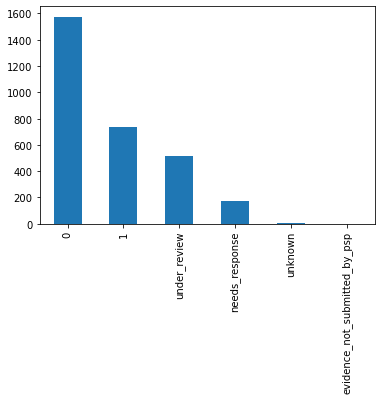

In [257]:
wyre.psp_status.value_counts().plot(kind="bar")

In [258]:
#We wanted the result column to be the last column in the data frame
wyre["res"] = wyre["psp_status"]
wyre = wyre.drop(["psp_status"],axis = 1)

In [259]:
#There are 3 reason code categories: fraud, service or refund. Here we created the column "Is_fraud"
#wyre.columns = wyre.columns.str.replace('reason_code', 'is_fraud')
#wyre = wyre.replace({10.4: 1, 4837: 1, 4853 : 0, 13.7 : 0, 13.1 : 0, 11.3 : 0, 12.6 : 0, 12.5: 0})
#wyre                                            

In [260]:
model = wyre[wyre["res"] != 0]
model = model[model["res"] != 1]

trained_wyre = wyre[wyre["res"] !="under_review"]
trained_wyre = trained_wyre[wyre["res"] !="unknown"]
trained_wyre = trained_wyre[wyre["res"] !="evidence_not_submitted_by_psp"]
trained_wyre = trained_wyre[wyre["res"] !="needs_response"]

trained_wyre
model

,index,amountConverted.USD,analyst_data.ekataAdress,analyst_data.ekataPhone,analyst_data.ekata_email_username,analyst_data.ekata_ip_address,analyst_data.truecaller,cryptoUsdFees,ip_address,numberOfDaysBetweenPosingCbkAndTransaction,refundStatusCode,match_count,analyst_data.status_4,analyst_data.status_9,avs_not_supported,reason_0,reason_fraud,reason_processingError,reason_service,psp_nmi,psp_tabapay,card_scheme_Mastercard,card_scheme_Visa,card_scheme_blo,crypto_purchased_currency_0,crypto_purchased_currency_,crypto_purchased_currency_BTC,crypto_purchased_currency_COMP,crypto_purchased_currency_DAI,crypto_purchased_currency_ETH,crypto_purchased_currency_LBTC,crypto_purchased_currency_USD,crypto_purchased_currency_USDC,crypto_purchased_currency_USDS,crypto_purchased_currency_USDT,paymentMethod_0,paymentMethod_applePay,paymentMethod_creditCard,paymentMethod_unknown,crypto_address_count,four_dig_count,apple_last_four_digits,email_count,cryptoDestination_count,cryptoSiteName_0,cryptoSiteName_1,cryptoSiteName_2,cryptoSiteName_3,cryptoSiteName_4,cryptoSiteName_5,billing_state_0,billing_state_1,billing_state_2,billing_state_3,billing_state_4,billing_state_5,res
10,10,267.04,0,0,0,0,0,10.11,53,9.0,False,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,1,1054,1,100,0,0,0,0,0,1,0,0,0,0,0,1,under_review
22,22,58.71,0,0,0,0,0,5.00,2,10.0,False,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1054,1,1,0,0,0,1,0,0,0,0,0,0,0,1,under_review
23,23,679.93,0,0,0,0,0,25.86,2,9.0,False,0,1,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,2,1054,1,1,0,0,0,1,0,0,0,0,0,0,0,1,under_review
340,340,263.25,0,0,0,0,0,9.82,53,70.0,False,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,1,1054,1,100,0,0,0,0,0,1,0,0,0,0,0,1,unknown
363,363,268.00,0,0,0,0,0,9.86,43,101.0,False,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,100,1,1054,1,100,0,0,0,0,0,1,0,0,0,0,0,1,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2444,2444,150.00,0,0,0,0,0,5.76,1503,0.0,False,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,33,33,33,33,33,0,1,0,1,0,1,0,0,0,0,1,0,needs_response
2446,2446,150.00,0,0,0,0,0,5.58,1503,0.0,False,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,33,33,33,33,33,0,1,0,1,0,1,0,0,0,0,1,0,needs_response
2447,2447,100.00,0,0,0,0,0,5.00,1503,0.0,False,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,33,33,33,33,33,0,1,0,1,0,1,0,0,0,0,1,0,needs_response
2448,2448,150.00,0,0,0,0,0,5.74,1503,0.0,False,0,0,1,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,33,33,33,33,33,0,1,0,1,0,1,0,0,0,0,1,0,needs_response


# Some Visualizations

<AxesSubplot:>

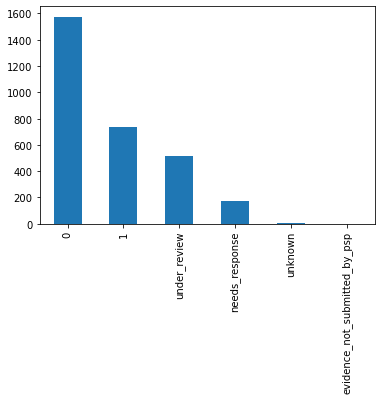

In [261]:
wyre.res.value_counts().plot(kind="bar")

<AxesSubplot:>

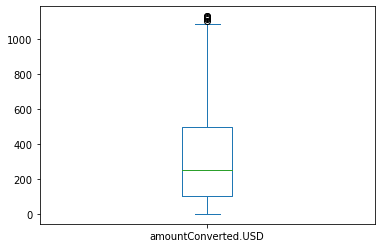

In [262]:
wyre['amountConverted.USD'].plot(kind = 'box')

# Now the fun begins!

## Preparing to train and test
 

In [263]:
def KfoldPlot(X, y, clf, k): #something is wrong with this func
    
    
    clfname = str(clf)[:str(clf).find("(")]
    
    plt.figure()
    
    kf = KFold(n_splits=k, shuffle=False)

    #Since we need to interpolate data, we set an mean tpr and fpr for later porpuses.
    mean_tpr = 0.0
    mean_fpr = np.linspace(0, 1, 100)

    i=1
    for train_index, validation_index in kf.split(X):
        
        print("folding No. ", i)
        
        #Splitting into train and validation, based on the current fold.
        X_train, X_validation = X[train_index], X[validation_index]
        y_train, y_validation = y[train_index], y[validation_index]


        clf.fit(X_train, y_train)
        
        #The prediction we want to test against are the probability of 1 of the X_test
        prob_prediction = clf.predict_proba(X_validation)[:, 1]
        
        #Right now we can set our ROC curve on the specific fold.
        fpr, tpr, thresholds = roc_curve(y_validation, prob_prediction)
        
        #We interpolate the mean_tpr so all of the classifiers will be working under the same thersholds.
        mean_tpr += interp(mean_fpr, fpr, tpr)
        mean_tpr[0] = 0.0
        
        #Plotting the fold 
        plt.plot(fpr, tpr, color='#D3D3D3')
        i+=1
    
    plt.plot([0], [0], color='#D3D3D3', linestyle='-', label='K-folds')    
    
    
    #Right now the mean_tpr is a sum (we added each iteration, so we finally divide by the number of folds)
    mean_tpr /= k
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    
    plt.plot(mean_fpr, mean_tpr, color='red', linestyle='-', label='Mean ROC (area = %0.3f)' % mean_auc)

    #Setting some boundaries .
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC for ' + clfname)
    plt.legend(loc="lower right")
    plt.show()

In [266]:
#Diving the data to X and y and then divide the data to train and test
X, y = trained_wyre.values[:,:-1], trained_wyre.values[:, -1]
y=y.astype('int')

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)
scaler = StandardScaler()
train_scaled = scaler.fit_transform(X_train)
valid_scaled = scaler.fit_transform(X_test)

The score is:  0.8717532467532467
AUC:  0.7468582984255381
folding No.  1
folding No.  2
folding No.  3
folding No.  4
folding No.  5
folding No.  6
folding No.  7
folding No.  8
folding No.  9
folding No.  10


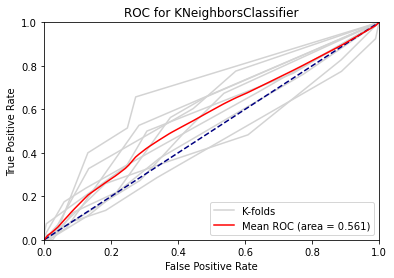

In [267]:
#KNN
classifier = KNeighborsClassifier(n_neighbors=5, weights='uniform', algorithm='auto', 
                                  leaf_size=30, p=2, metric='manhattan', metric_params=None, n_jobs=None)
classifier.fit(train_scaled, y_train)
y_pred_labels = classifier.predict_proba(valid_scaled)
y_pred = classifier.predict(valid_scaled)


print("The score is: ",classifier.score(train_scaled,y_train))
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred)
print("AUC: " ,metrics.auc(fpr,tpr))

KfoldPlot(X, y, classifier, 10)

The score is:  0.6791125541125541
AUC:  0.6588184313159036
folding No.  1
folding No.  2
folding No.  3
folding No.  4
folding No.  5
folding No.  6
folding No.  7
folding No.  8
folding No.  9
folding No.  10


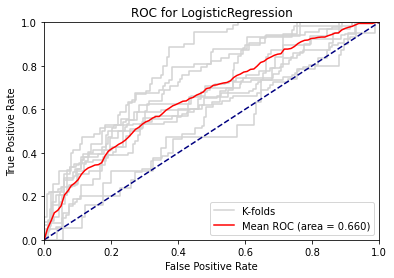

In [268]:
#Logistic regression
log_clf = LogisticRegression(C= 0.1, max_iter= 100, penalty='l1', solver= 'liblinear')
log_clf.fit(X_train, y_train)
y_pred_labels = log_clf.predict_proba(valid_scaled)[:,1]
y_pred = log_clf.predict(valid_scaled)

print("The score is: ",log_clf.score(train_scaled,y_train))
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred)
print("AUC: " ,metrics.auc(fpr,tpr))
KfoldPlot(X, y, log_clf, 10)

The score is:  0.8928571428571429
AUC:  0.720785786508739
folding No.  1
folding No.  2
folding No.  3
folding No.  4
folding No.  5
folding No.  6
folding No.  7
folding No.  8
folding No.  9
folding No.  10


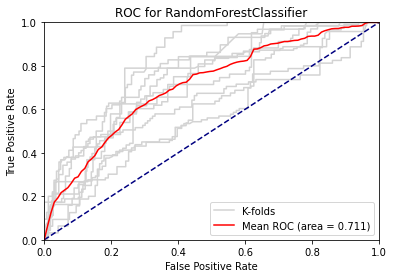

In [269]:
#Random forest
clf = RandomForestClassifier(n_estimators=200, criterion='gini', max_depth=10,min_samples_split=2, min_samples_leaf=2,
                             min_weight_fraction_leaf=0.0,max_features='auto', max_leaf_nodes=None, bootstrap=True, oob_score=False, n_jobs=None,
                             random_state=42, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0, max_samples=None)

clf.fit(train_scaled, y_train)

y_pred = clf.predict(valid_scaled)
y_pred_labels =  clf.predict_proba(valid_scaled)[:,1]
print("The score is: ",clf.score(train_scaled,y_train))
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred)
print("AUC: " ,metrics.auc(fpr,tpr))


KfoldPlot(X, y, clf, 10)

The auc is 72.0786%


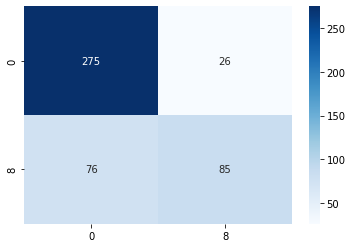

<Figure size 1440x1440 with 0 Axes>

In [270]:
#Confusion Matrix for RandomForest:
cm = confusion_matrix(y_test ,y_pred)
print("The auc is {}%".format(round(metrics.auc(fpr,tpr)*100,4)))
sns.heatmap(cm,annot=True,fmt='g',cmap='Blues', xticklabels = [0,8], yticklabels = [0,8])
plt.show()
fig= plt.figure(figsize=(20,20))


Decision tree accuracy(in %): 73.37662337662337
AUC:  0.684457605084501
folding No.  1
folding No.  2
folding No.  3
folding No.  4
folding No.  5
folding No.  6
folding No.  7
folding No.  8
folding No.  9
folding No.  10


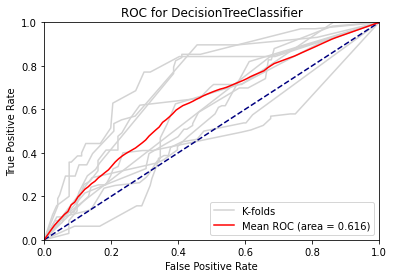

In [271]:
#DT
dtclf = DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=12, min_samples_split=2, min_samples_leaf=9,
                               min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, class_weight=None, ccp_alpha=0.0)
dtclf = dtclf.fit(train_scaled,y_train)

y_pred = dtclf.predict(valid_scaled)
y_pred_labels = dtclf.predict_proba(valid_scaled)[:,1]
#print(y_pred_labels)
print("Decision tree accuracy(in %):", metrics.accuracy_score(y_test, y_pred)*100)
fpr, tpr, thresholds = metrics.roc_curve(y_test,y_pred)
print("AUC: " ,metrics.auc(fpr,tpr))
KfoldPlot(X, y, dtclf, 10)

In [272]:
#Chosen model: Random forest
#Now we will add a prediction to the data set and insert it to the analyst tool
# d = {1:'Won', 0:'Lost'}
# wyre_raw["prediction"] = clf.predict(X)
# wyre_raw["Precentage_prediction"] = clf.predict_proba(X)[:,1]
# wyre_raw["Precentage_prediction"] = wyre_raw["Precentage_prediction"]*100
# wyre_raw["prediction"] = wyre_raw["prediction"].replace(d)
# wyre_raw.drop("index",axis=1,inplace=True)
# wyre_raw

In [279]:
#Chosen model: Random forest
#Now we will add a prediction to the data set and insert it to the analyst tool
model["res"] = 0
model
X_m, y_m = wyre.values[:,:-1], wyre.values[:, -1]
y=y.astype('int')

clf.fit(X, y)
labels = clf.predict_proba(X_m)[:,1]
#print(len(labels))
counter = 0
for cbk in wyre_json:
    cbk["pred"] = labels[counter]
    counter += 1
wyre_json_copy[0]

{'_id': {'$oid': '61254ae49782f20007d416e8'},
 'chargeback_id': '2020339012482',
 '__v': 2,
 'ac_metadata': {'dataSources': ['identity-providers', 'reason-group'],
  'wasPspDecisionResultNotified': False,
  'migrationObjects': ['b2b',
   'billing',
   'appeal',
   'proof',
   'return',
   'customer',
   'order',
   'communication',
   'shipping',
   'subscription',
   'fee',
   'risk',
   'refund',
   'usage',
   'industry',
   'verification',
   'cancellation',
   'card',
   'transaction',
   'internal'],
  'missingDataSources': [],
  '_id': {'$oid': '6214e6ff09c0481a0410f6cb'},
  'handlingChargebacksType': 'internal',
  'createdAt': {'$date': {'$numberLong': '1662545524620'}},
  'updatedAt': {'$date': {'$numberLong': '1662545524620'}},
  'systemNotes': [],
  'internalReasonGroup': {'$oid': '61c49e6280c2812d68bf1d53'},
  'dataEnhancements': {'provided': ['verifications']}},
 'amount': 304.78,
 'analyst_data': {'labels': [],
  'status': 9,
  'status_last_update': {'$date': {'$numberLon

In [280]:
wyre_json_copy[0]

{'_id': {'$oid': '61254ae49782f20007d416e8'},
 'chargeback_id': '2020339012482',
 '__v': 2,
 'ac_metadata': {'dataSources': ['identity-providers', 'reason-group'],
  'wasPspDecisionResultNotified': False,
  'migrationObjects': ['b2b',
   'billing',
   'appeal',
   'proof',
   'return',
   'customer',
   'order',
   'communication',
   'shipping',
   'subscription',
   'fee',
   'risk',
   'refund',
   'usage',
   'industry',
   'verification',
   'cancellation',
   'card',
   'transaction',
   'internal'],
  'missingDataSources': [],
  '_id': {'$oid': '6214e6ff09c0481a0410f6cb'},
  'handlingChargebacksType': 'internal',
  'createdAt': {'$date': {'$numberLong': '1662545524620'}},
  'updatedAt': {'$date': {'$numberLong': '1662545524620'}},
  'systemNotes': [],
  'internalReasonGroup': {'$oid': '61c49e6280c2812d68bf1d53'},
  'dataEnhancements': {'provided': ['verifications']}},
 'amount': 304.78,
 'analyst_data': {'labels': [],
  'status': 9,
  'status_last_update': {'$date': {'$numberLon

In [281]:
#Here we create a json file with the data+ our predictions. We need to use Json format in order to add our predictions to the analyst tool
wyre_raw_transposed = wyre_raw.transpose()
wyre_raw_transposed.to_json('Project_Ido_Inbar.json',orient="index")


In [282]:
#result = wyre_raw.to_json()
#parsed = json.loads(result)
#json.dumps(parsed)  